<a href="https://colab.research.google.com/github/padenalex/pdf417-segmentation/blob/main/Pdf417_Finder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install dependencies: 
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.7.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.7)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
import torch
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("barcodes_train", {}, "/content/drive/MyDrive/pdf417/images/train/train.json", "/content/drive/MyDrive/pdf417/images/train")
register_coco_instances("barcodes_val", {}, "/content/drive/MyDrive/pdf417/images/validation/validation.json", "/content/drive/MyDrive/pdf417/images/validation")


WARNING [12/19 23:30:28 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/19 23:30:28 d2.data.datasets.coco]: Loaded 210 images in COCO format from /content/drive/MyDrive/pdf417/images/train/train.json


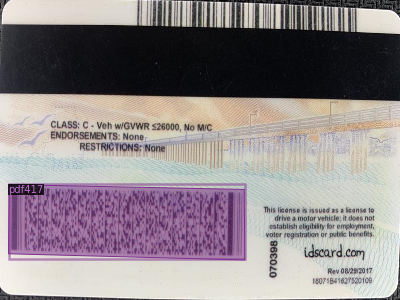

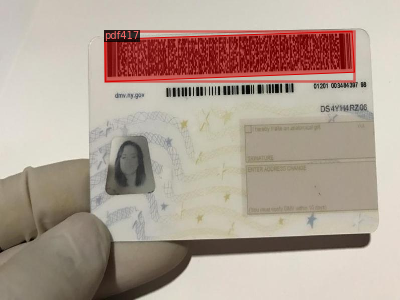

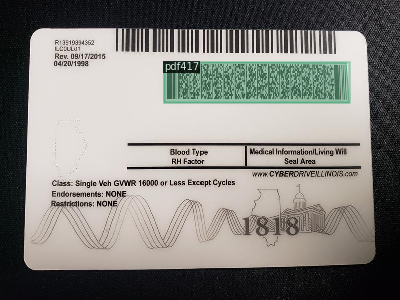

In [ ]:
#visualize training data
barcodes_train_metadata = MetadataCatalog.get("barcodes_train")
barcodes_val_metadata = MetadataCatalog.get("barcodes_val")
dataset_dicts = DatasetCatalog.get("barcodes_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=barcodes_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("barcodes_train",)
cfg.DATASETS.TEST = ("barcodes_val",)
evaluator = COCOEvaluator("barcodes_val", cfg, False, output_dir="./output/")
cfg.TEST.EVAL_PERIOD = 100
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1800
cfg.OUTPUT_DIR = "/content/drive/MyDrive/pdf417/output"
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1



WARNING [12/19 23:30:33 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass tasks in directly


In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):
    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"
    return COCOEvaluator("barcodes_val", cfg, False, output_folder)


In [ ]:

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/19 23:30:44 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[12/19 23:30:44 d2.engine.train_loop]: Starting training from iteration 0
[12/19 23:30:51 d2.utils.events]:  eta: 0:09:35  iter: 19  total_loss: 1.568  loss_cls: 0.7101  loss_box_reg: 0.06211  loss_mask: 0.6906  loss_rpn_cls: 0.06744  loss_rpn_loc: 0.02199  time: 0.3247  data_time: 0.0213  lr: 4.9953e-06  max_mem: 8320M
[12/19 23:30:57 d2.utils.events]:  eta: 0:09:30  iter: 39  total_loss: 1.432  loss_cls: 0.5964  loss_box_reg: 0.06888  loss_mask: 0.6652  loss_rpn_cls: 0.0537  loss_rpn_loc: 0.0237  time: 0.3282  data_time: 0.0125  lr: 9.9902e-06  max_mem: 8320M
[12/19 23:31:04 d2.utils.events]:  eta: 0:09:25  iter: 59  total_loss: 1.205  loss_cls: 0.4109  loss_box_reg: 0.07346  loss_mask: 0.6255  loss_rpn_cls: 0.04495  loss_rpn_loc: 0.02245  time: 0.3266  data_time: 0.0118  lr: 1.4985e-05  max_mem: 8320M
[12/19 23:31:11 d2.utils.events]:  eta: 0:09:20  iter: 79  total_loss: 0.989  loss_cls: 0.2644  loss_box_reg: 0.07833  loss_mask: 0.561  loss_rpn_cls: 0.02784  loss_rpn_loc: 0.02355  t

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.DATASETS.TEST = ("barcodes_val", )
predictor = DefaultPredictor(cfg)

WARNING [12/19 23:45:13 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/19 23:45:13 d2.data.datasets.coco]: Loaded 37 images in COCO format from /content/drive/MyDrive/pdf417/images/validation/validation.json


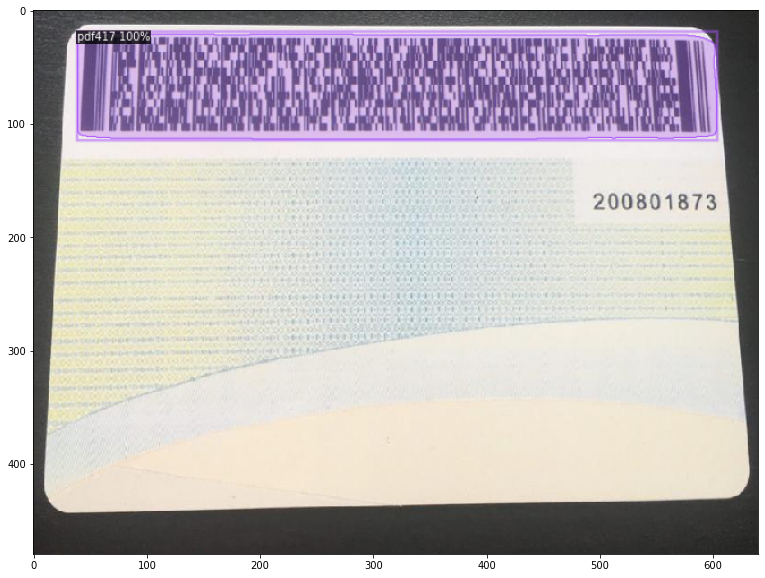

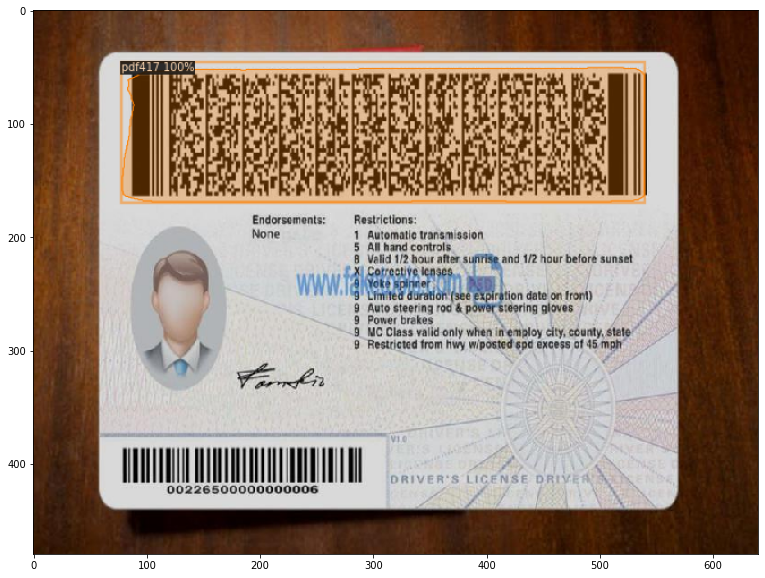

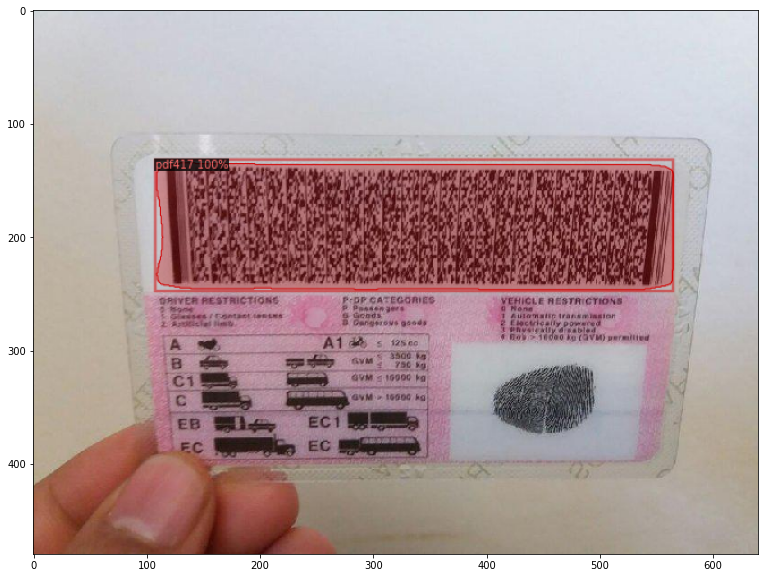

In [ ]:

from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("barcodes_val")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=barcodes_train_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    import matplotlib.pyplot as plt
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

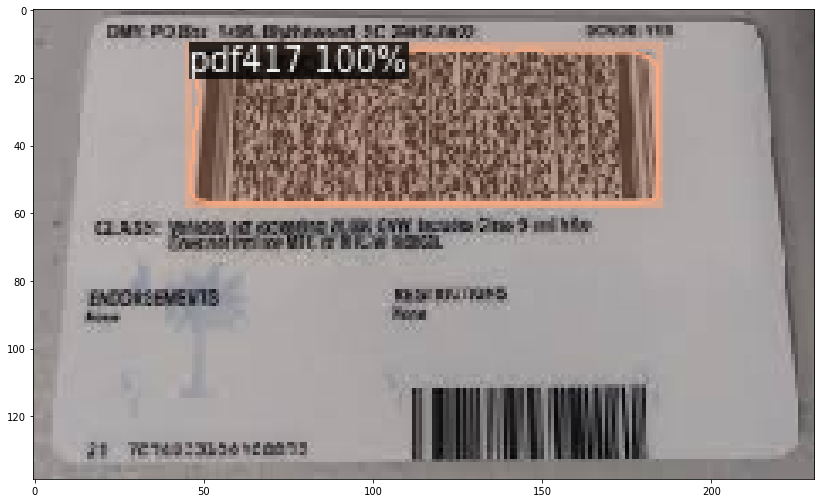

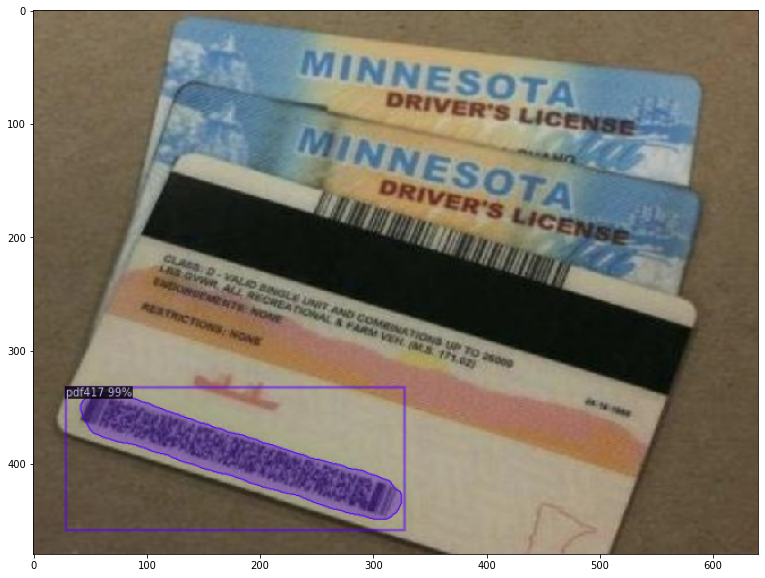

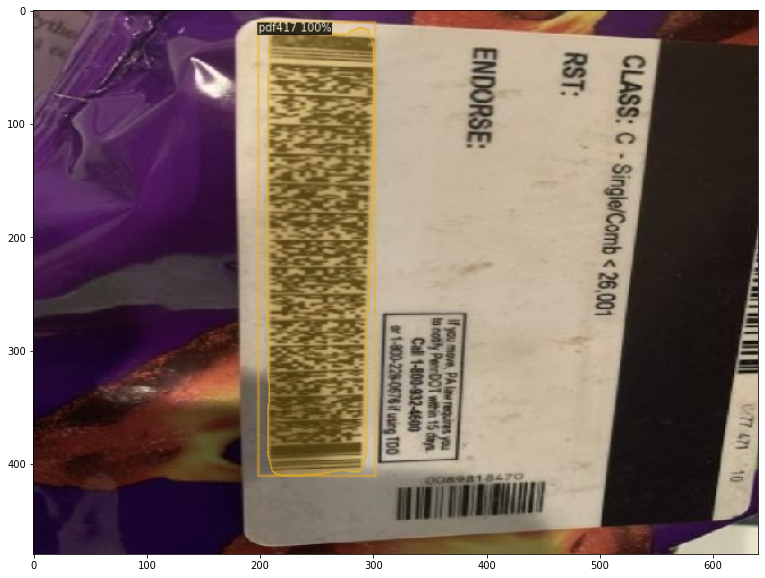

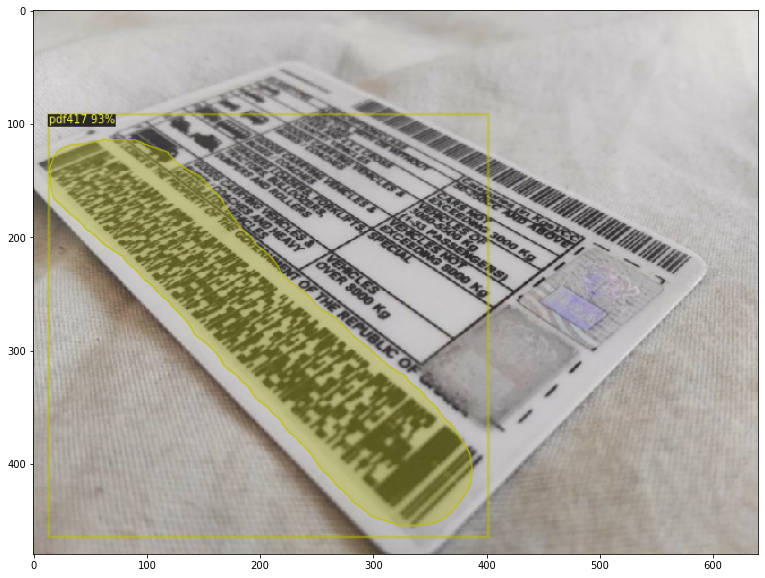

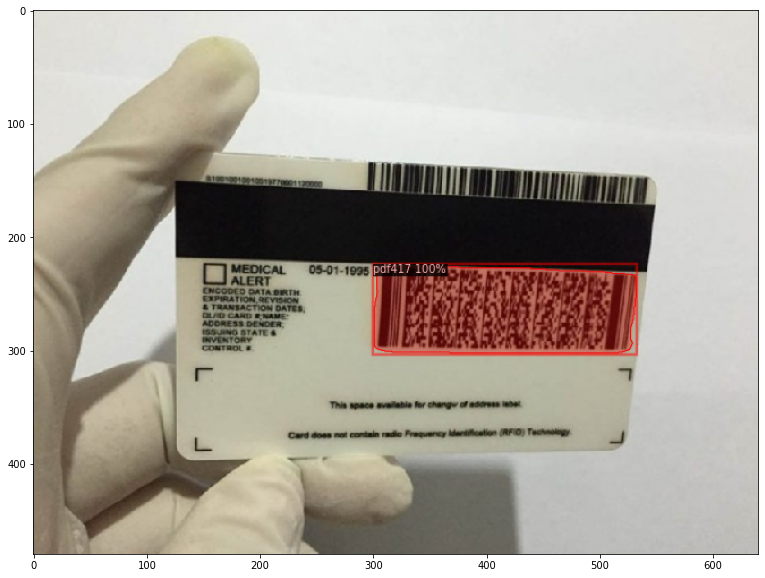

...

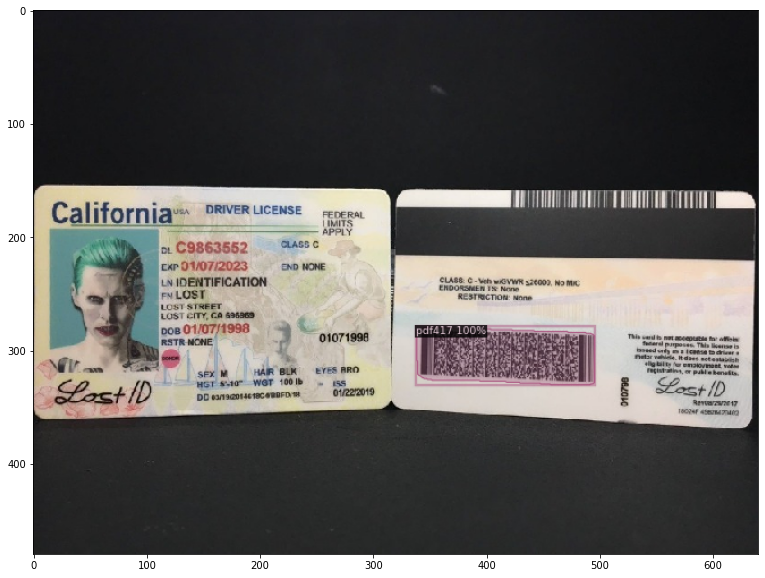

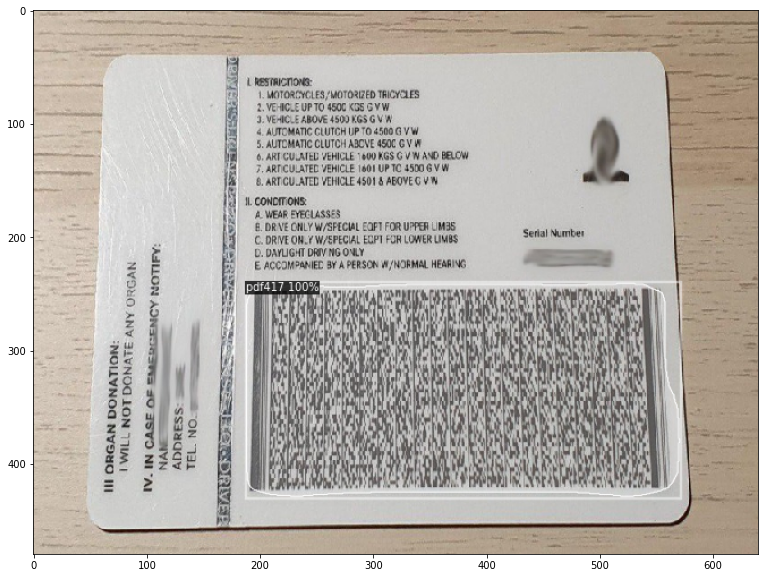

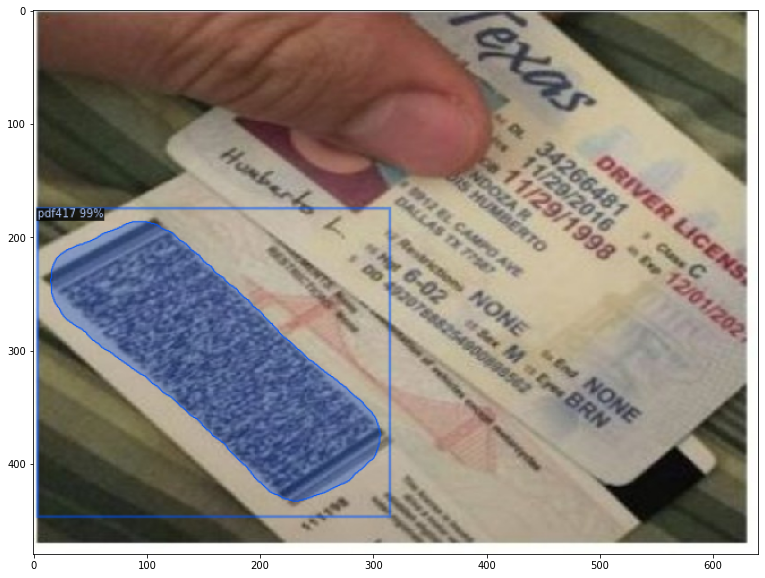

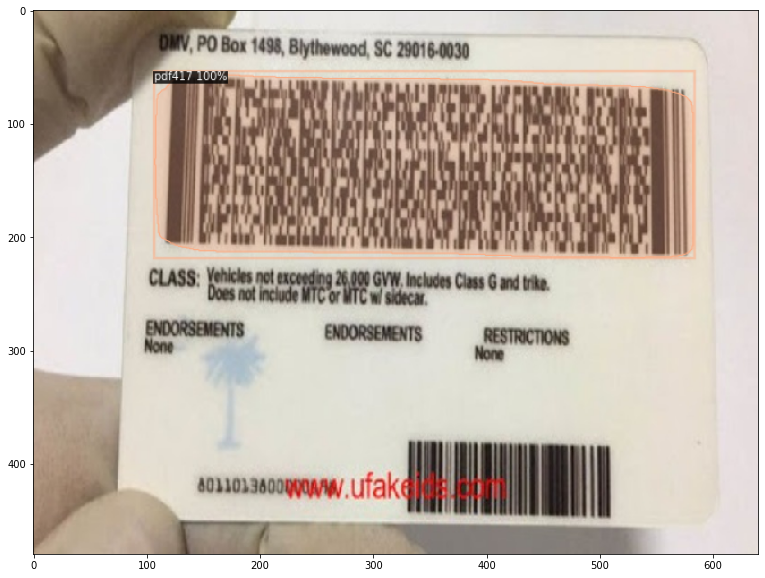

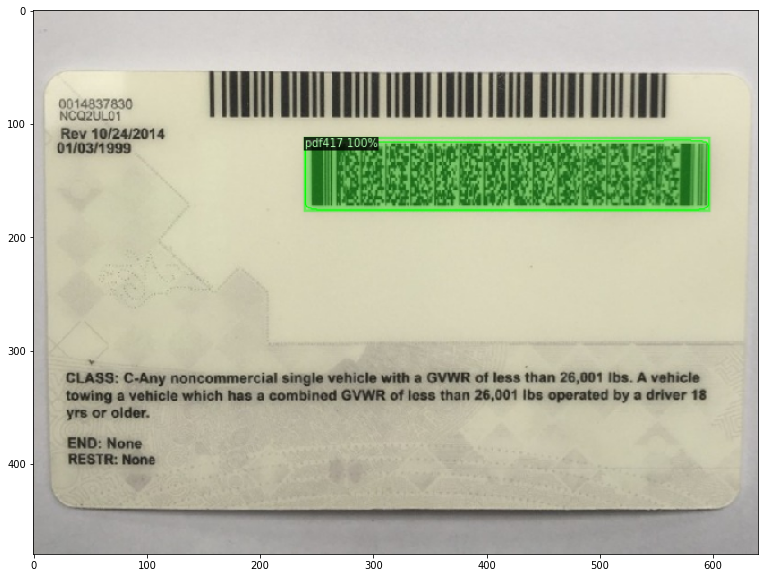

In [ ]:

from detectron2.utils.visualizer import ColorMode
import glob
#dataset_dicts = DatasetCatalog.get("barcodes_val")
#for d in random.sample(dataset_dicts, 3):  
for d in glob.glob('/content/drive/MyDrive/pdf417/images/test/test/*'):
    #print("XX" + d)
    im = cv2.imread(d)

    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=barcodes_train_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    import matplotlib.pyplot as plt
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()